In [1]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# torch version updaed to 1.7.0; 11/24/2020
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.7.0")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 617kB/s 
     |████████████████████████████████| 2.2MB 21.2MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201122-cp36-none-any.whl size=44456 sha256=be156ab561b3ebebdce34376bd5120363066b6ab8f8cd8d4764cd60d471db668
  Stored in directory: /root/.cache/pip/wheels/33/7b/ec/59dffd0a0aa995739aad60ac97e70252247e9d17eae69c1cee
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!unzip /content/drive/MyDrive/training_dataset.zip

Archive:  /content/drive/MyDrive/training_dataset.zip
   creating: training_dataset/
   creating: training_dataset/train/
  inflating: training_dataset/train/1100_017 cropped.json  
 extracting: training_dataset/train/1100_017 cropped.png  
  inflating: training_dataset/train/1100_019 cropped.json  
 extracting: training_dataset/train/1100_019 cropped.png  
  inflating: training_dataset/train/1100_027 cropped.json  
 extracting: training_dataset/train/1100_027 cropped.png  
  inflating: training_dataset/train/800_012 cropped.json  
 extracting: training_dataset/train/800_012 cropped.png  
  inflating: training_dataset/train/800_013 cropped.json  
 extracting: training_dataset/train/800_013 cropped.png  
  inflating: training_dataset/train/800_021 cropped.json  
 extracting: training_dataset/train/800_021 cropped.png  
  inflating: training_dataset/train/800_022 cropped.json  
 extracting: training_dataset/train/800_022 cropped.png  
   creating: training_dataset/validate/
  inflating: 

In [4]:
!pip install labelme2coco

In [5]:
# import package
import labelme2coco
labelme2coco.convert("training_dataset/train", "training_dataset/train/annotation_train.json")
labelme2coco.convert("training_dataset/validate", "training_dataset/validate/annotation_validate.json")

In [6]:
from detectron2.data.datasets import register_coco_instances
# args: name(str), metadata (dict): default empty, json_file_path (str), image_root (str or path like): root directory for images  
register_coco_instances("my_dataset_t", {}, "training_dataset/train/annotation_train.json", "")
register_coco_instances("my_dataset_v", {}, "training_dataset/validate/annotation_validate.json", "")

[12/02 02:44:48 d2.data.datasets.coco]: Loaded 7 images in COCO format from training_dataset/train/annotation_train.json
training_dataset/train/1100_027 cropped.png


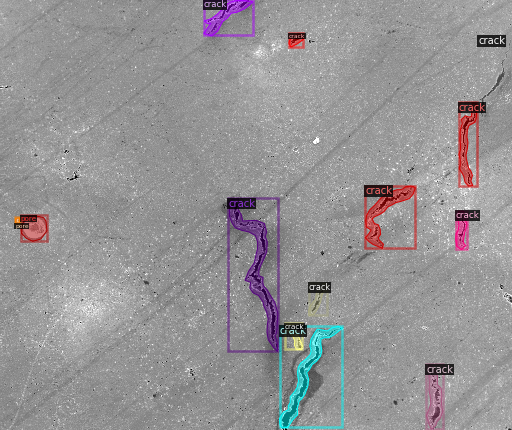

In [7]:
dataset_dict=DatasetCatalog.get("my_dataset_t")
mymetadata=MetadataCatalog.get("my_dataset_t")
#dataset_dicts = get_balloon_dicts("balloon/train")
for d in random.sample(dataset_dict, 1):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=mymetadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [13]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_t",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 10000   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # two classes(crack and pore)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/02 03:10:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (2, 256, 1, 1) in

[12/02 03:10:17 d2.engine.train_loop]: Starting training from iteration 0
[12/02 03:10:28 d2.utils.events]:  eta: 1:30:43  iter: 19  total_loss: 5.557  loss_cls: 1.072  loss_box_reg: 0.4756  loss_mask: 0.6919  loss_rpn_cls: 3.027  loss_rpn_loc: 0.3279  time: 0.5416  data_time: 0.0245  lr: 4.9953e-06  max_mem: 3344M
[12/02 03:10:39 d2.utils.events]:  eta: 1:32:05  iter: 39  total_loss: 3.087  loss_cls: 0.9949  loss_box_reg: 0.5139  loss_mask: 0.6862  loss_rpn_cls: 0.5149  loss_rpn_loc: 0.3048  time: 0.5473  data_time: 0.0070  lr: 9.9902e-06  max_mem: 3344M
[12/02 03:10:50 d2.utils.events]:  eta: 1:31:30  iter: 59  total_loss: 2.617  loss_cls: 0.9144  loss_box_reg: 0.5355  loss_mask: 0.6747  loss_rpn_cls: 0.2247  loss_rpn_loc: 0.2923  time: 0.5432  data_time: 0.0071  lr: 1.4985e-05  max_mem: 3344M
[12/02 03:11:01 d2.utils.events]:  eta: 1:31:35  iter: 79  total_loss: 2.479  loss_cls: 0.8163  loss_box_reg: 0.5192  loss_mask: 0.66  loss_rpn_cls: 0.1874  loss_rpn_loc: 0.2685  time: 0.5449  

In [14]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 446), started 1:40:55 ago. (Use '!kill 446' to kill it.)

<IPython.core.display.Javascript object>

In [15]:
# cfg already contains everything we've set previously. Now we changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[12/02 04:51:44 d2.data.datasets.coco]: Loaded 2 images in COCO format from training_dataset/validate/annotation_validate.json
training_dataset/validate/1100_018 cropped.png


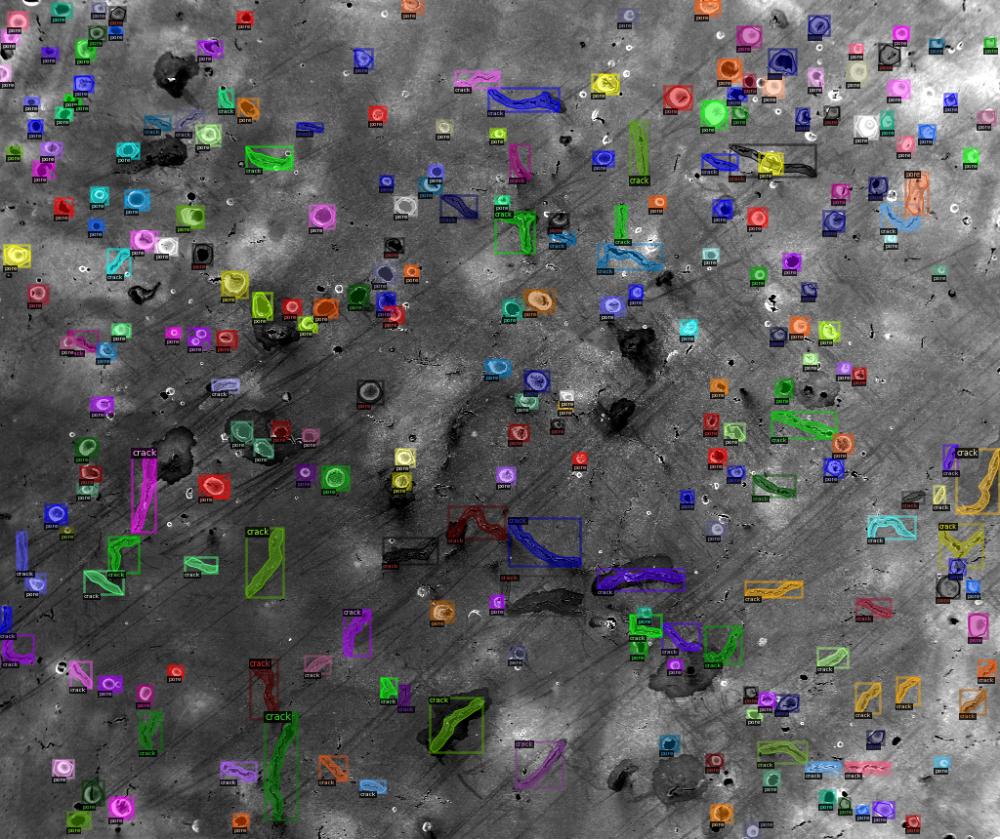

training_dataset/validate/1100_016 cropped.png


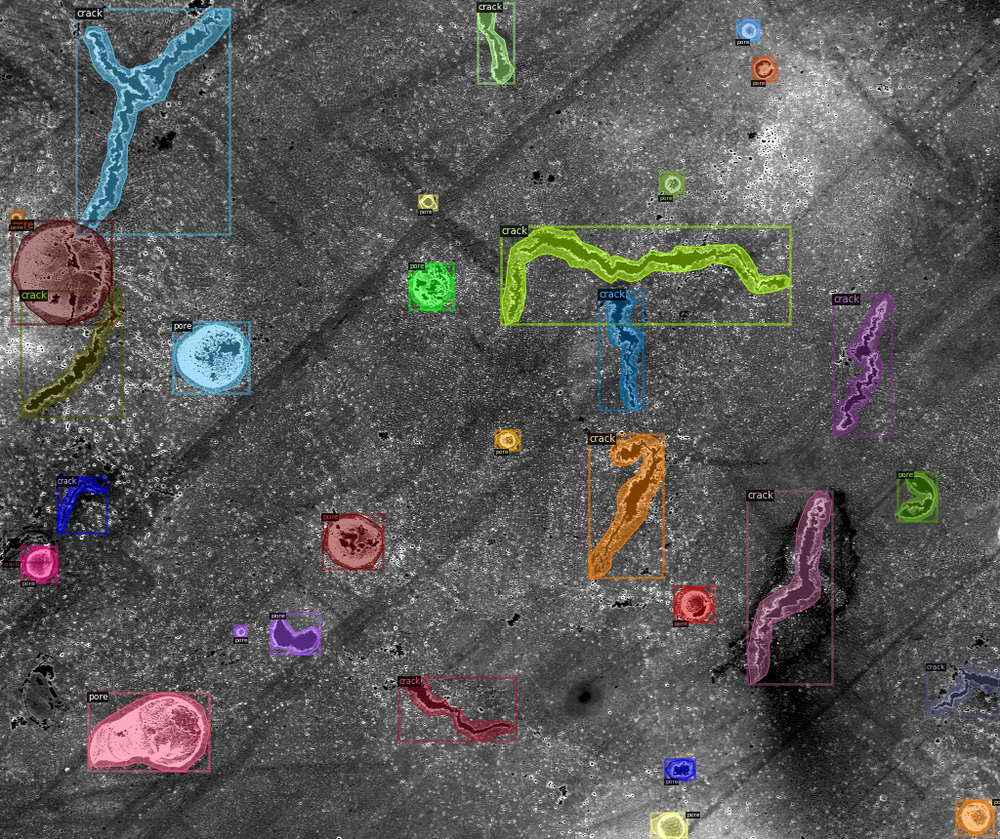

In [18]:
dataset_dict2=DatasetCatalog.get("my_dataset_v")
mymetadata2=MetadataCatalog.get("my_dataset_v")
#dataset_dicts = get_balloon_dicts("balloon/train")
for d in random.sample(dataset_dict2, 2):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=mymetadata2, scale=1)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

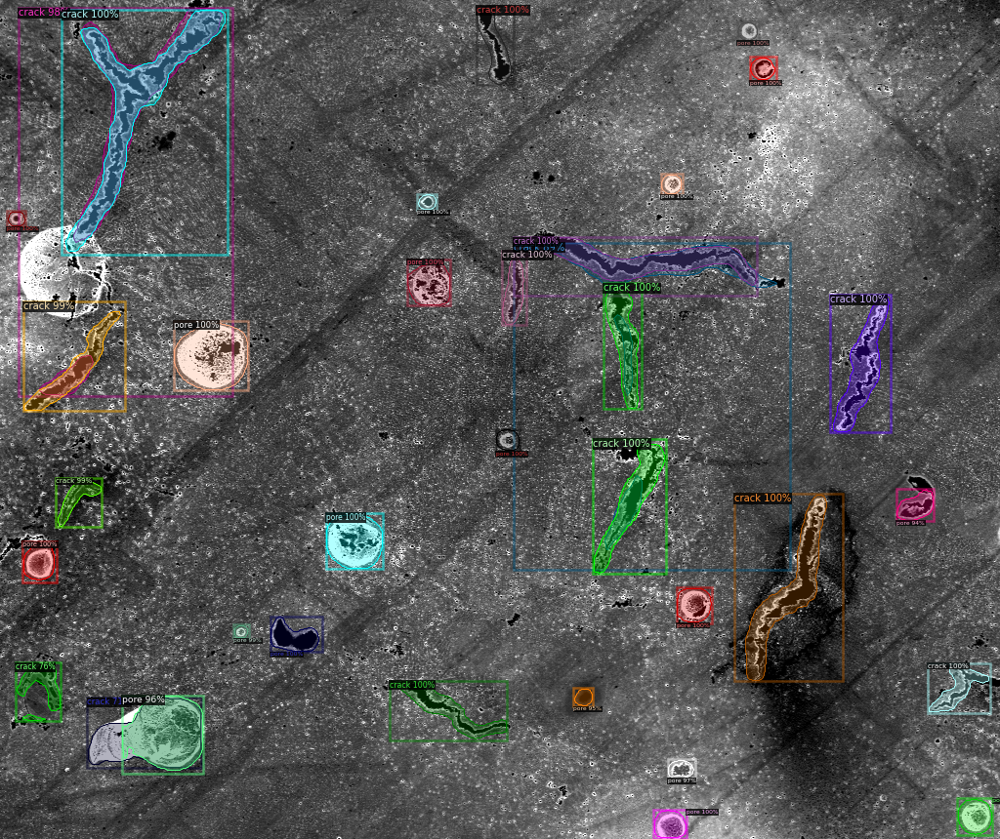

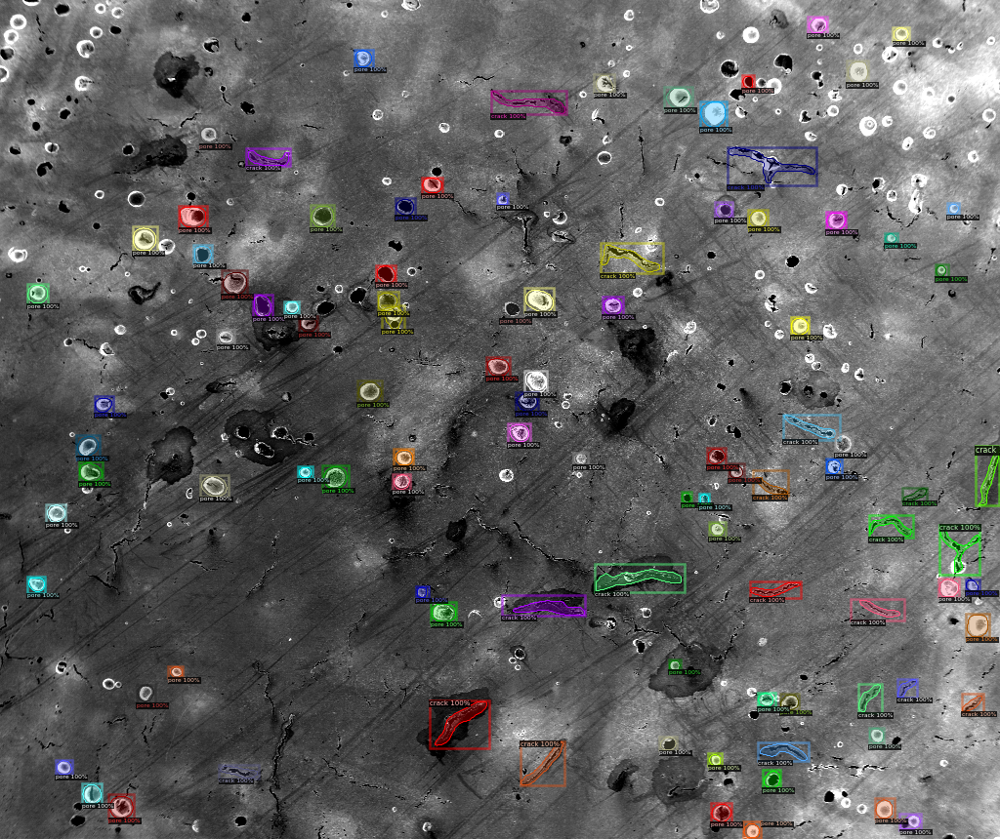

In [19]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = dataset_dict2
for d in random.sample(dataset_dicts, 2):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=mymetadata2, 
                   scale=1, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])